In [102]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

In [103]:
df=pd.read_csv(r'train.csv')

In [104]:
df.isnull().sum()

user_name             19393
country                  35
review_title              0
review_description        0
designation           23647
points                    0
price                  5569
province                 35
region_1              12754
region_2              46708
winery                    0
variety                   0
dtype: int64

In [105]:
df.describe()

,points,price
count,82657.000000,77088.000000
mean,88.544564,36.922232
std,3.099649,43.698346
min,80.000000,4.000000
25%,86.000000,18.000000
50%,88.000000,27.000000
75%,91.000000,45.000000
max,100.000000,3300.000000


In [106]:
df.isnull().sum()

user_name             19393
country                  35
review_title              0
review_description        0
designation           23647
points                    0
price                  5569
province                 35
region_1              12754
region_2              46708
winery                    0
variety                   0
dtype: int64

In [107]:
df.drop('user_name',axis=1,inplace=True)

In [108]:
df.drop(['region_2'],axis=1,inplace=True)

In [109]:
df.variety.value_counts()

Pinot Noir                    10587
Chardonnay                     9403
Cabernet Sauvignon             7552
Red Blend                      7166
Bordeaux-style Red Blend       5497
Riesling                       4148
Sauvignon Blanc                4011
Syrah                          3316
Rosé                           2831
Merlot                         2471
Nebbiolo                       2242
Zinfandel                      2209
Sangiovese                     2165
Malbec                         2119
Portuguese Red                 1969
White Blend                    1896
Sparkling Blend                1739
Tempranillo                    1448
Rhône-style Red Blend          1182
Pinot Gris                     1148
Champagne Blend                1133
Cabernet Franc                 1095
Grüner Veltliner               1055
Portuguese White                896
Pinot Grigio                    873
Bordeaux-style White Blend      850
Gewürztraminer                  840
Gamay                       

In [110]:
df.drop('designation',axis=1,inplace=True)

In [111]:
df.winery.value_counts()

Testarossa               175
Louis Latour             168
Williams Selyem          165
Georges Duboeuf          163
Chateau Ste. Michelle    163
                        ... 
LaStella                   1
La Diligence               1
Kato                       1
Clos Larcis                1
Guillaume Gros             1
Name: winery, Length: 13786, dtype: int64

In [112]:
df.country.value_counts()

US                38573
France            15948
Italy              9112
Portugal           3197
Chile              2891
Spain              2755
Argentina          2570
Austria            1892
Germany            1573
New Zealand        1121
Australia          1028
South Africa        727
Israel              320
Canada              176
Greece              139
Bulgaria             93
Romania              80
England              62
Slovenia             42
Mexico               38
Moldova              35
Hungary              35
Turkey               33
Uruguay              33
Lebanon              28
Brazil               28
Morocco              21
Georgia              12
Croatia              12
Ukraine              11
Peru                  8
Cyprus                6
Switzerland           5
Luxembourg            5
Macedonia             5
Serbia                4
Czech Republic        3
India                 1
Name: country, dtype: int64

In [113]:
df.drop(['review_title'],axis=1,inplace=True)

In [114]:
df.price=df.groupby('variety')['price'].transform(lambda x: x.fillna(x.median()))

In [115]:
df.isnull().sum()

country                  35
review_description        0
points                    0
price                     0
province                 35
region_1              12754
winery                    0
variety                   0
dtype: int64

In [116]:
df.groupby(['country','province'])['region_1'].first().to_frame()


region_1
country   province                                 
Argentina Mendoza Province                  Mendoza
          Other                            San Juan
Australia Australia Other   South Eastern Australia
          New South Wales                Tumbarumba
          South Australia               Eden Valley
...                                             ...
Uruguay   Juanico                              None
          Montevideo                           None
          Progreso                             None
          San Jose                             None
          Uruguay                              None

[358 rows x 1 columns]

In [117]:
df.region_1=df.groupby(['country','province'])['region_1'].transform(lambda x: x.fillna(f'others'))

In [118]:
df.isnull().sum()

country               35
review_description     0
points                 0
price                  0
province              35
region_1              35
winery                 0
variety                0
dtype: int64

In [119]:
df.dropna(inplace=True)

In [120]:
df

,country,review_description,points,price,province,region_1,winery,variety
0,Australia,"Classic Chardonnay aromas of apple, pear and h...",83,10.0,Australia Other,South Eastern Australia,Andrew Peace,Chardonnay
1,US,This wine is near equal parts Syrah and Merlot...,89,15.0,Washington,Columbia Valley (WA),North by Northwest,Red Blend
2,Italy,Barolo Conca opens with inky dark concentratio...,94,80.0,Piedmont,Barolo,Renato Ratti,Nebbiolo
3,France,It's impressive what a small addition of Sauvi...,87,22.0,Southwest France,Bergerac Sec,Domaine l'Ancienne Cure,Bordeaux-style White Blend
4,France,"This ripe, sweet wine is rich and full of drie...",88,33.0,France Other,Vin de Liqueur,Château du Cèdre,Malbec
...,...,...,...,...,...,...,...,...
82652,Spain,"Hot earth, baked cherry and mild vanilla aroma...",84,12.0,Northern Spain,Rioja,Montecillo,Tempranillo
82653,US,"Pungent, high-pitched notes of turmeric and dr...",85,21.0,New Mexico,New Mexico,Vivác Winery,Cabernet Sauvignon
82654,France,This is a wine that's not just lively and frui...,87,14.0,Beaujolais,Beaujolais-Villages,Domaine de la Madone,Gamay
82655,France,"An impressive wine, it already shows signs of ...",91,20.0,Bordeaux,Haut-Médoc,Château Beaumont,Bordeaux-style Red Blend


In [121]:
#making a new column with range of review points for better understanding
df.loc[(df['points'] > 80) & (df['points'] <=85), 'wine_quality'] = 'Average'
df.loc[(df['points'] > 85) & (df['points'] <=90), 'wine_quality'] = 'Good'
df.loc[(df['points'] > 90) & (df['points'] <=95), 'wine_quality'] = 'Great'
df.loc[(df['points'] > 95) & (df['points'] <=100), 'wine_quality'] = 'Perfect'


In [122]:
df.loc[(df['price'] > 0) & (df['price'] <=25) , 'price_val'] = '0-25'
df.loc[(df['price'] > 26) & (df['price'] <=50) , 'price_val'] = '26-50'
df.loc[(df['price'] > 51) & (df['price'] <=75) , 'price_val'] = '51-75'
df.loc[(df['price'] > 76) & (df['price'] <=100) , 'price_val'] = '76-100'

df.loc[df['price'] > 100  , 'price_val'] = 'Above 100'

In [124]:
df

,country,review_description,points,price,province,region_1,winery,variety,wine_quality,price_val
0,Australia,"Classic Chardonnay aromas of apple, pear and h...",83,10.0,Australia Other,South Eastern Australia,Andrew Peace,Chardonnay,Average,0-25
1,US,This wine is near equal parts Syrah and Merlot...,89,15.0,Washington,Columbia Valley (WA),North by Northwest,Red Blend,Good,0-25
2,Italy,Barolo Conca opens with inky dark concentratio...,94,80.0,Piedmont,Barolo,Renato Ratti,Nebbiolo,Great,76-100
3,France,It's impressive what a small addition of Sauvi...,87,22.0,Southwest France,Bergerac Sec,Domaine l'Ancienne Cure,Bordeaux-style White Blend,Good,0-25
4,France,"This ripe, sweet wine is rich and full of drie...",88,33.0,France Other,Vin de Liqueur,Château du Cèdre,Malbec,Good,26-50
...,...,...,...,...,...,...,...,...,...,...
82652,Spain,"Hot earth, baked cherry and mild vanilla aroma...",84,12.0,Northern Spain,Rioja,Montecillo,Tempranillo,Average,0-25
82653,US,"Pungent, high-pitched notes of turmeric and dr...",85,21.0,New Mexico,New Mexico,Vivác Winery,Cabernet Sauvignon,Average,0-25
82654,France,This is a wine that's not just lively and frui...,87,14.0,Beaujolais,Beaujolais-Villages,Domaine de la Madone,Gamay,Good,0-25
82655,France,"An impressive wine, it already shows signs of ...",91,20.0,Bordeaux,Haut-Médoc,Château Beaumont,Bordeaux-style Red Blend,Great,0-25


In [13]:
from nltk.stem import WordNetLemmatizer
import nltk
from nltk.corpus import stopwords

lemmatizer = WordNetLemmatizer()

data=df.copy()
for i in data.review_description:
    # Importing tokenize library
    from nltk.tokenize import word_tokenize
    # Tokenizing the words not using the treebankTokenizer as it was changing the text and using it with punctuation marks 
    tokens = word_tokenize(i)
    
    # Changing all the letters to lowercase 
    tokens_low = [w.lower() for w in tokens]
    
    
    # Removing all non-alphabetics from the descriptions 
    words = [word for word in tokens_low if word.isalpha()]
    
    # Removing stopwords.

    filter_sen = [w for w in words if not w in stopwords.words('english')]
    

    stemmed = [lemmatizer.lemmatize(word) for word in filter_sen]
    
    sentence = " ".join(w for w in stemmed)
    data = data.replace(i , sentence)

In [14]:
data

,country,review_description,points,price,winery,variety,wine_quality,price_val
0,Australia,classic chardonnay aroma apple pear hay lead p...,83,10.0,Andrew Peace,Chardonnay,Average,0-10
1,US,wine near equal part syrah merlot balance cabe...,89,15.0,North by Northwest,Red Blend,Good,10-20
2,Italy,barolo conca open inky dark concentration soot...,94,80.0,Renato Ratti,Nebbiolo,Great,50-100
3,France,impressive small addition sauvignon gris musca...,87,22.0,Domaine l'Ancienne Cure,Bordeaux-style White Blend,Good,20-30
4,France,ripe sweet wine rich full dried fresh fruit fl...,88,33.0,Château du Cèdre,Malbec,Good,30-50
...,...,...,...,...,...,...,...,...
82652,Spain,hot earth baked cherry mild vanilla aroma come...,84,12.0,Montecillo,Tempranillo,Average,10-20
82653,US,pungent note turmeric dried flower hit nose fi...,85,21.0,Vivác Winery,Cabernet Sauvignon,Average,20-30
82654,France,wine lively fruity weight structure well keepi...,87,14.0,Domaine de la Madone,Gamay,Good,10-20
82655,France,impressive wine already show sign potential el...,91,20.0,Château Beaumont,Bordeaux-style Red Blend,Great,10-20


In [20]:
total_rev=' '.join(data.review_description)

In [21]:
total_rev

'classic chardonnay aroma apple pear hay lead palate marked decent intensity also bit sweetness orange candy note run rather short finish wine near equal part syrah merlot balance cabernet sauvignon aroma blue fruit vanilla cherry herb lead flavor bring sense deliciousness hard resist barolo conca open inky dark concentration soothing aroma black fruit spice cola plum prune dried lavender bud nose present ethereal delicate aroma mouth delivers thicker flavor chocolate mocha drink impressive small addition sauvignon gris muscadelle turn exotic wine spice lychee flavor ripe sweet wine rich full dried fresh fruit flavor spicy touch spirit palate well bold fruit dense tannin sweet aftertaste drink strident aroma licorice herb berry mint make interesting palate light fresh raspberry red currant flavor lot heft extract depth wine likable unhindered excess oak enjoyable due unchallenging simplicity half syrah half cabernet sauvignon new french oak wine draw note blackberry milk chocolate anis

In [16]:
!pip install wordcloud

     -------------------------------------- 152.1/152.1 kB 1.8 MB/s eta 0:00:00


In [17]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

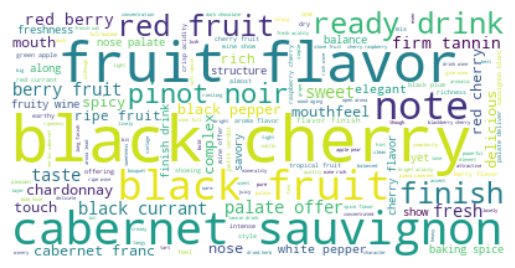

In [22]:
stopwords = set(STOPWORDS)

wordcloud = WordCloud(stopwords = stopwords, background_color = "white").generate(total_rev)
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

from here we can say that the most frequent words are Fruit, Flavour, Black, Cherry, Cabernet, Sauvignon, red etc. which are related to wiine quality so if we focus on this qualities there can be a incrising profit for the company

<Axes: xlabel='wine_quality', ylabel='count'>

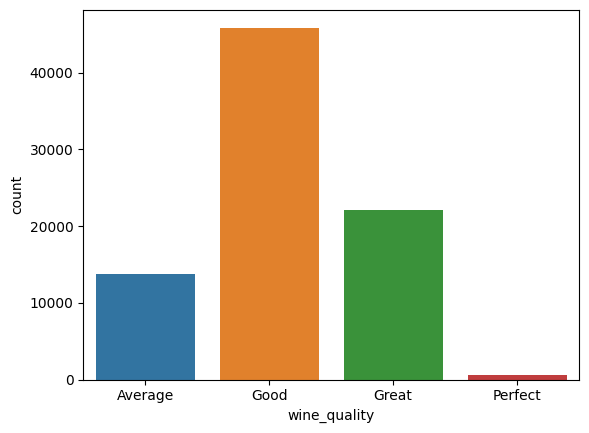

In [30]:
sn.countplot(x=data.wine_quality)

here the market for perfect wine is very less, so if the qulity rise we will get more potential comsumers  

<Axes: xlabel='country'>

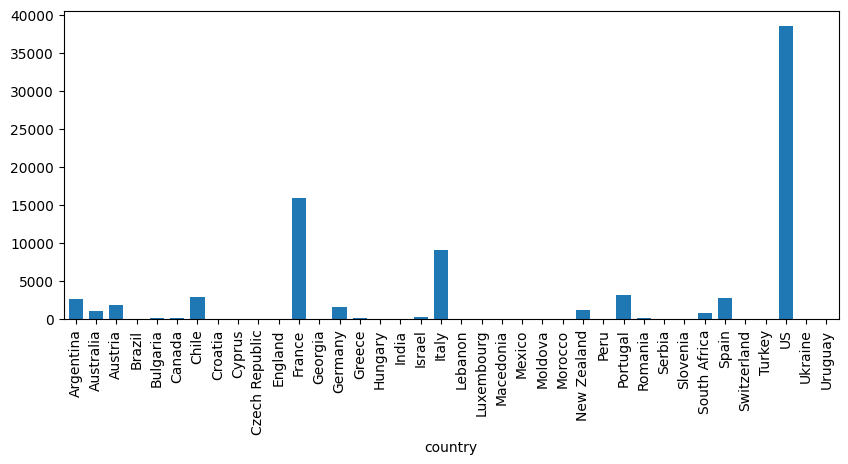

In [43]:
wines_country = pd.crosstab(index = data['country'], columns = 'count')
wines_country['count'].plot(kind = 'bar',width= 0.7)


As we can see larger portion of revenue is coming from US only, so can give more attention to US market then some attention to France,Italy, Argentina etc and pay less attention to other countries where there are negligible consumers

<Axes: xlabel='variety'>

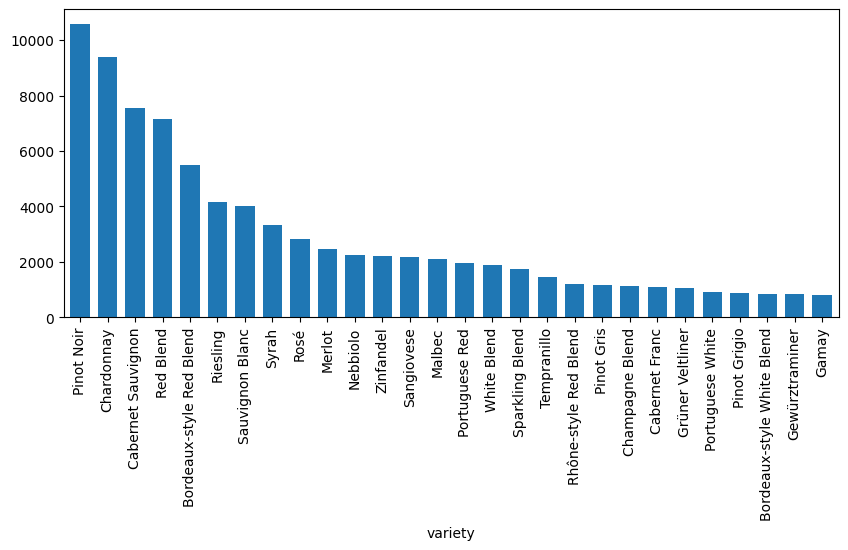

In [47]:
variety = pd.crosstab(index = data['variety'], columns = 'count').sort_values('count' , ascending = False)
variety['count'].plot(kind = 'bar', width = 0.7)

We can stop selling Gamay, Gewurztraminer, Bordeaux, pinot grigio as there are not affecting our revenue that much

<Axes: xlabel='price_val'>

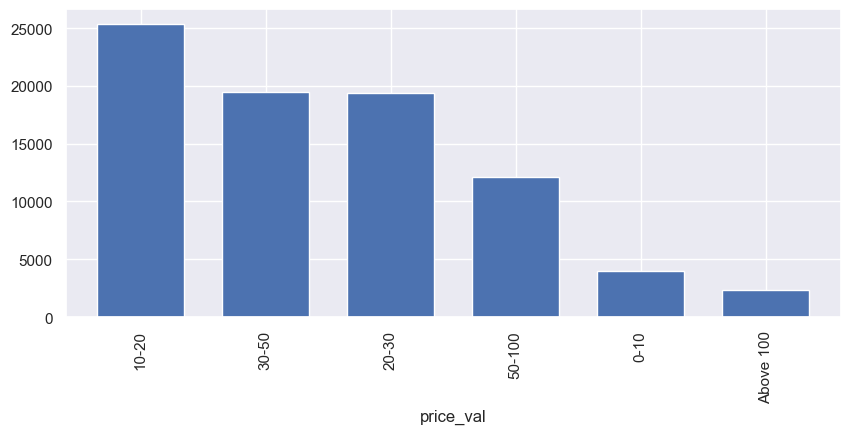

In [126]:
price = pd.crosstab(index = data['price_val'], columns = 'count').sort_values('count' , ascending = False)
price['count'].plot(kind = 'bar', width = 0.7)

<Axes: xlabel='price_val', ylabel='count'>

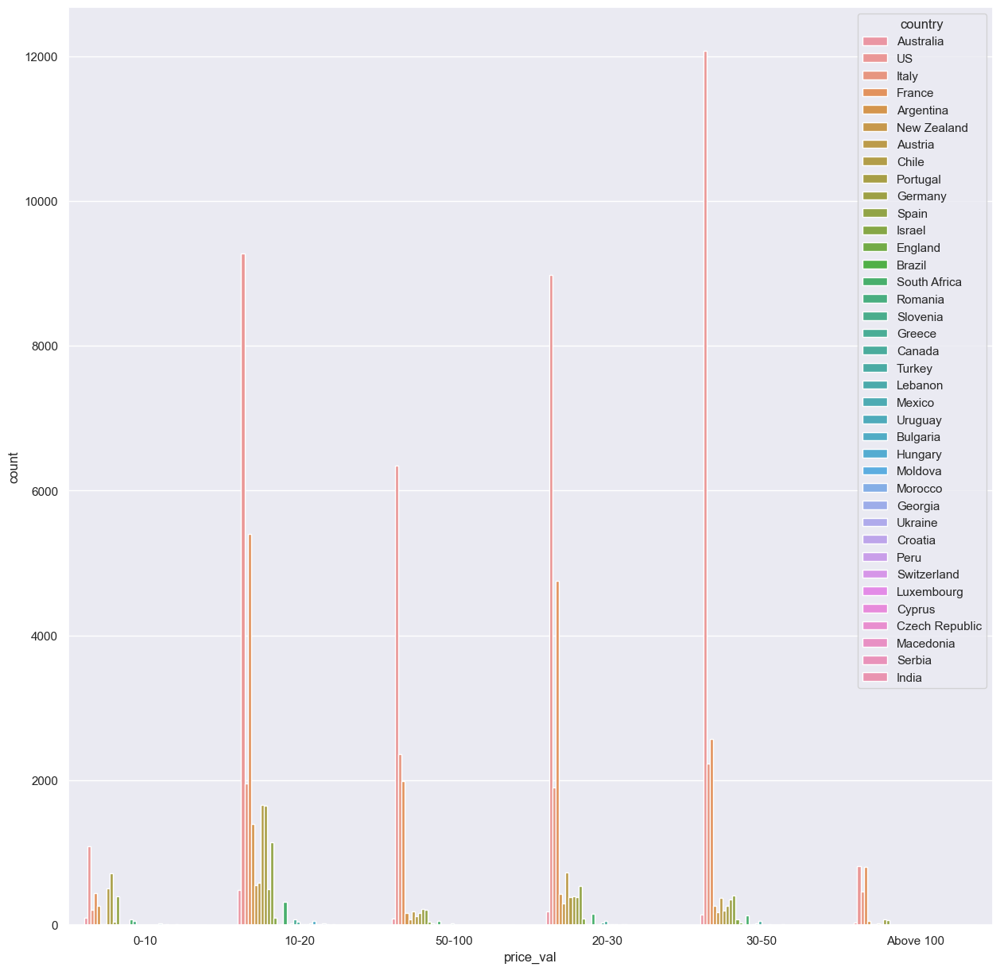

In [70]:
plt.figure(figsize=(15,15))
sn.countplot(hue=data.country,x=data.price_val)

<Axes: xlabel='price_val', ylabel='count'>

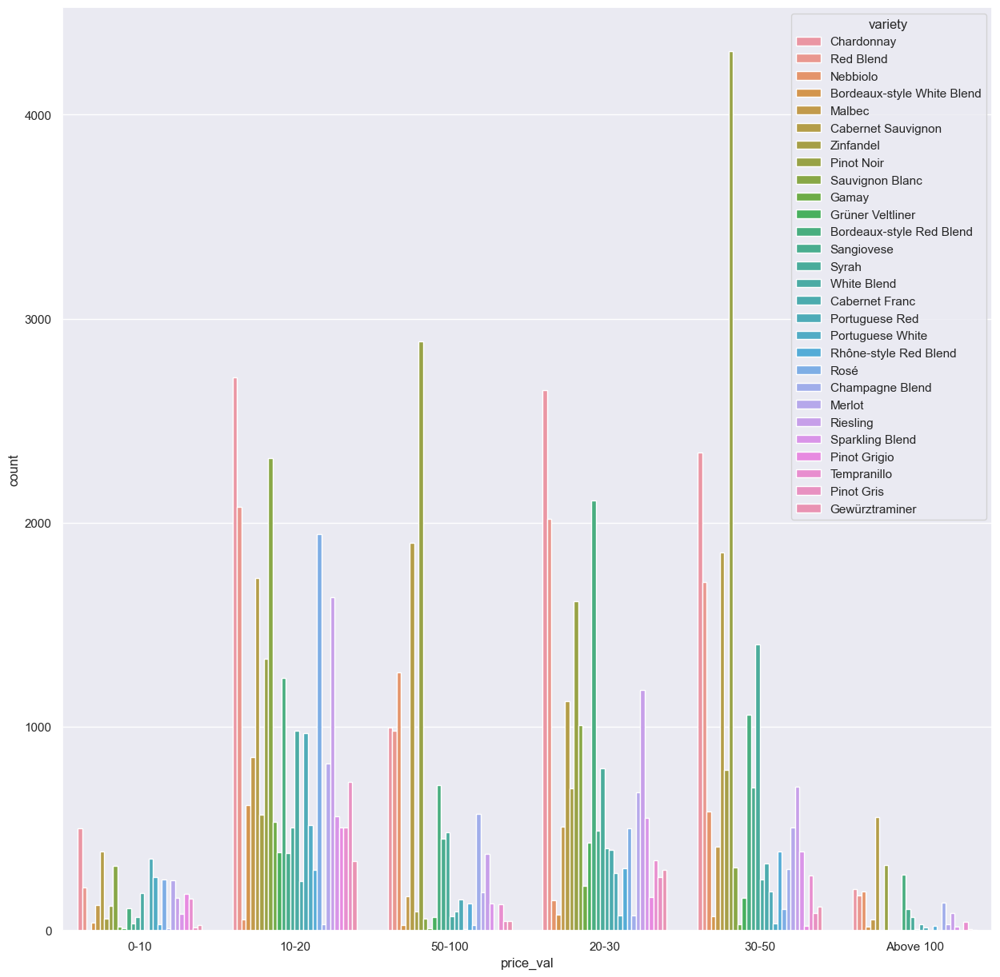

In [69]:
plt.figure(figsize=(15,15))
sn.countplot(hue=data.variety,x=data.price_val)


From these couple of graph we can figure out which countries have higher demand of which wine and at what price